In [1]:
#%matplotlib inline 
from __future__ import division
from pylab import *
import skimage as ski
from skimage import data, io, filters, exposure
from skimage.filters import rank
from skimage import img_as_float, img_as_ubyte
from skimage.morphology import disk
import skimage.morphology as mp
from skimage import util
from skimage.color import rgb2hsv, hsv2rgb, rgb2gray
from skimage.filters.edges import convolve
from matplotlib import pylab as plt
import numpy as np
from numpy import array
from IPython.display import display
from ipywidgets import interact, interactive, fixed
from ipywidgets import *
from ipykernel.pylab.backend_inline import flush_figures
import copy as cp
import cv2
def on_change(img, gamma=1):
    return img ** gamma
sys.setrecursionlimit(999999999)

edges = []
copy = []
samolotwyn = []
maxx = 0
minx = 0
maxy = 0
miny = 0
lista = []

def przejdz(k, j, kolor):
    global maxx
    global minx
    global maxy
    global miny
    global lista
    if(maxx < k):
        maxx =k
    if(maxy < j):
        maxy = j
    if(minx > k):
        minx = k
    if(miny > j):
        miny = j
    global copy
    global samolotwyn
    copy[k][j] = 1
    lista.append([k,j])
    #samolotwyn[k][j][0] = kolor[0]
    #samolotwyn[k][j][1] = kolor[1]
    #samolotwyn[k][j][2] = kolor[2]
    #print(k, j, edges[k+1][j],copy[k+1][j], edges[k-1][j],copy[k-1][j], edges[k][j+1],copy[k][j+1], edges[k][j-1],copy[k][j-1])
    if(edges[k+1][j] == 255 and copy[k+1][j] == 0):
        przejdz(k+1, j, kolor)
    if(edges[k-1][j] == 255 and copy[k-1][j] == 0):
        przejdz(k-1, j, kolor)
    if(edges[k][j+1] == 255 and copy[k][j+1] == 0):
        przejdz(k, j+1, kolor)
    if(edges[k][j-1] == 255 and copy[k][j-1] == 0):
         przejdz(k, j-1, kolor)

def circle(k, l, r):
    global samolotwyn
    samolotwyn[k][l][0] = 255
    samolotwyn[k][l][1] = 255
    samolotwyn[k][l][2] = 255
    kpom = k - r
    for i in range(r+1):
        for j in range(i+1):
            samolotwyn[kpom+i][l+j-1][0] = 255
            samolotwyn[kpom+i][l+j-1][1] = 255
            samolotwyn[kpom+i][l+j-1][2] = 255
    kpom = k + r
    for i in range(r+1):
        for j in range(i+1):
            samolotwyn[kpom-i][l+j-1][0] = 255
            samolotwyn[kpom-i][l+j-1][1] = 255
            samolotwyn[kpom-i][l+j-1][2] = 255
    kpom = k - r
    for i in range(r+1):
        for j in range(i+1):
            samolotwyn[kpom+i][l-j-1][0] = 255
            samolotwyn[kpom+i][l-j-1][1] = 255
            samolotwyn[kpom+i][l-j-1][2] = 255
    kpom = k + r
    for i in range(r+1):
        for j in range(i+1):
            samolotwyn[kpom-i][l-j-1][0] = 255
            samolotwyn[kpom-i][l-j-1][1] = 255
            samolotwyn[kpom-i][l-j-1][2] = 255
    

def disp (names):
    global samolotwyn
    fig = figure(figsize=(25, 80))
    for i, name in enumerate(names):
        subplot(9, 2, i+1)
        samolot = cv2.imread(name) 
        samolot = cv2.resize(samolot, (0,0), fx=0.57, fy=0.57)
        samolotwyn = io.imread(name)  
        samolotwyn = cv2.resize(samolotwyn, (0,0), fx=0.57, fy=0.57)
        samolot = cv2.GaussianBlur(samolot,(1,1),0)
        samolot = cv2.medianBlur(samolot,5)
        samolot = on_change(samolot, 0.65)
        samolot = samolot.astype(np.uint8)
        

        sr = np.mean(samolot)
        med = np.median(samolot)
        sr = abs(sr - med) + sr
        odch = np.std(samolot)
        global edges
        edges = cv2.Canny(samolot,sr, sr + 3*odch)
        samolot = cv2.GaussianBlur(samolot,(5,5),0)
        edges = mp.dilation(edges)

        global copy
        copy = cp.deepcopy(edges)
        for k in range(len(copy)):
            for j in range(len(copy[0])):
                copy[k][j] = 0
        kolor = ((255,0,0),(255,0,255),(0,0,255),(0,255,255),(0,255,0),(255,255,0))
        col = -1
        for k, x in enumerate(edges):
            for j, y in enumerate(x):      
                if(y == 255 and copy[k][j] == 0):
                    col = col + 1
                    if col == 6:
                        col = 0
                    global minx
                    global miny
                    global maxx
                    global maxy
                    global lista
                    lista = []
                    minx = 1000000;maxx = 0;miny = 1000000;maxy = 0;
                    przejdz(k, j, kolor[col])
                    centerx = int((maxx - minx)/2) + minx
                    centery = int((maxy - miny)/2) + miny
                    for t in lista:
                        if(maxx-minx>30 and maxy-miny>30):
                            samolotwyn[t[0]][t[1]][0] = kolor[col][0]
                            samolotwyn[t[0]][t[1]][1] = kolor[col][1]
                            samolotwyn[t[0]][t[1]][2] = kolor[col][2]
                    if(maxx-minx>30 and maxy-miny>30):
                        circle(centerx, centery, 4)
                    #print(name)
                      
                        
                   
                    
        im = io.imshow(samolotwyn)
        plt.axis('off')
    fig.savefig('samoloty16.pdf')

if __name__ == '__main__':
    names = ['samolot00.jpg', 'samolot01.jpg', 'samolot18.jpg', 'samolot03.jpg', 'samolot04.jpg', 'samolot05.jpg', 
            'samolot20.jpg', 'samolot07.jpg', 'samolot08.jpg', 'samolot09.jpg', 'samolot10.jpg', 'samolot11.jpg', 
            'samolot19.jpg', 'samolot13.jpg', 'samolot14.jpg', 'samolot15.jpg', 'samolot16.jpg', 'samolot17.jpg']
    disp(names)   


In [2]:
#%matplotlib inline 
from __future__ import division
from pylab import *
import skimage as ski
from skimage import data, io, filters, exposure
from skimage.filters import rank
from skimage import img_as_float, img_as_ubyte
from skimage.morphology import disk
import skimage.morphology as mp
from skimage import util
from skimage.color import rgb2hsv, hsv2rgb, rgb2gray
from skimage.filters.edges import convolve
from matplotlib import pylab as plt
import numpy as np
from numpy import array
from IPython.display import display
from ipywidgets import interact, interactive, fixed
from ipywidgets import *
from ipykernel.pylab.backend_inline import flush_figures
from skimage import measure
import copy as cp
import cv2
sys.setrecursionlimit(100000)
def on_change(img, gamma=1):
    return img ** gamma

lista = []
edges = []
copy = []
def przejdz(k, j):
    global edges
    global lista
    global copy
    lista.append([k,j])
    copy[k][j] = 1
    if(edges[k+1][j] == 255 and copy[k+1][j] == 0):
        przejdz(k+1, j)
    if(edges[k-1][j] == 255 and copy[k-1][j] == 0):
        przejdz(k-1, j)
    if(edges[k][j+1] == 255 and copy[k][j+1] == 0):
        przejdz(k, j+1)
    if(edges[k][j-1] == 255 and copy[k][j-1] == 0):
        przejdz(k, j-1)

def disp (names):
    fig = figure(figsize=(25, 80))
    for i, name in enumerate(names):
        subplot(9, 2, i+1)
        samolot = cv2.imread(name) 
        samolotwyn = io.imread(name)
        samolot = cv2.GaussianBlur(samolot,(1,1),0)
        samolot = cv2.medianBlur(samolot,5)
        samolot = on_change(samolot, 0.65)
        samolot = samolot.astype(np.uint8)
        

        sr = np.mean(samolot)
        odch = np.std(samolot)
        global edges
        edges = cv2.Canny(samolot,sr, sr + 3*odch)
        edges = mp.dilation(edges)
        edges = mp.dilation(edges)
        global copy
        copy = cp.deepcopy(edges)
        for k in range(len(copy)):
            for j in range(len(copy[0])):
                copy[k][j] = 0
        kolor = ((255,0,0),(255,0,255),(0,0,255),(0,255,255),(0,255,0),(255,255,0))
        col = 0
        contours = measure.find_contours(edges, 200,fully_connected='high', positive_orientation='high')
        for k in contours:

            for j in k:
                samolotwyn[int(j[0])][int(j[1])][0] = kolor[col][0]
                samolotwyn[int(j[0])][int(j[1])][1] = kolor[col][1]
                samolotwyn[int(j[0])][int(j[1])][2] = kolor[col][2] 
                
            col = col + 1
            if col == 6:
                col = 0
                        
                   
                    
        im = io.imshow(samolotwyn)
        plt.axis('off')
    fig.savefig('samoloty16-find_contours.pdf')

if __name__ == '__main__':
    names = ['samolot00.jpg', 'samolot01.jpg', 'samolot18.jpg', 'samolot03.jpg', 'samolot04.jpg', 'samolot05.jpg', 
            'samolot20.jpg', 'samolot07.jpg', 'samolot08.jpg', 'samolot09.jpg', 'samolot10.jpg', 'samolot11.jpg', 
            'samolot19.jpg', 'samolot13.jpg', 'samolot14.jpg', 'samolot15.jpg', 'samolot16.jpg', 'samolot17.jpg']
    disp(names)   

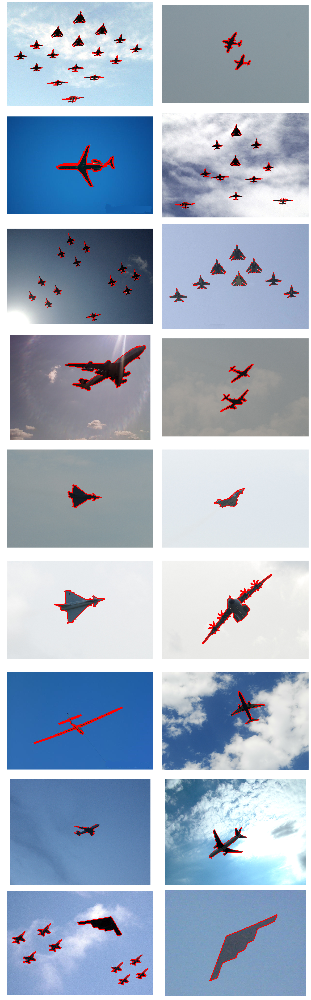

In [3]:
%matplotlib inline 
from __future__ import division
from pylab import *
import skimage as ski
from skimage import data, io, filters, exposure
from skimage.filters import rank
from skimage import img_as_float, img_as_ubyte
from skimage.morphology import disk
import skimage.morphology as mp
from skimage import util
from skimage.color import rgb2hsv, hsv2rgb, rgb2gray
from skimage.filters.edges import convolve
from matplotlib import pylab as plt
import numpy as np
from numpy import array
from IPython.display import display
from ipywidgets import interact, interactive, fixed
from ipywidgets import *
from ipykernel.pylab.backend_inline import flush_figures
import copy as cp
import cv2
def on_change(img, gamma=1):
    return img ** gamma
sys.setrecursionlimit(999999999)

edges = []
copy = []
samolotwyn = []

def przejdz(k, j, kolor):
    global copy
    global samolotwyn
    copy[k][j] = 1
    samolotwyn[k][j][0] = kolor[0]
    samolotwyn[k][j][1] = kolor[1]
    samolotwyn[k][j][2] = kolor[2]
    #print(k, j, edges[k+1][j],copy[k+1][j], edges[k-1][j],copy[k-1][j], edges[k][j+1],copy[k][j+1], edges[k][j-1],copy[k][j-1])
    if(edges[k+1][j] == 255 and copy[k+1][j] == 0):
        przejdz(k+1, j, kolor)
    if(edges[k-1][j] == 255 and copy[k-1][j] == 0):
        przejdz(k-1, j, kolor)
    if(edges[k][j+1] == 255 and copy[k][j+1] == 0):
        przejdz(k, j+1, kolor)
    if(edges[k][j-1] == 255 and copy[k][j-1] == 0):
         przejdz(k, j-1, kolor)


def disp (names):
    global samolotwyn
    fig = figure(figsize=(25, 80))
    for i, name in enumerate(names):
        subplot(9, 2, i+1)
        samolot = cv2.imread(name) 
        samolotwyn = io.imread(name)  
        samolot = cv2.GaussianBlur(samolot,(1,1),0)
        samolot = cv2.medianBlur(samolot,5)
        samolot = on_change(samolot, 0.65)
        samolot = samolot.astype(np.uint8)


        sr = np.mean(samolot)
        odch = np.std(samolot)
        global edges
        edges = cv2.Canny(samolot,sr, sr + 3*odch)
        edges = mp.dilation(edges)
        edges = mp.dilation(edges)

        global copy
        copy = cp.deepcopy(edges)
        for k in range(len(copy)):
            for j in range(len(copy[0])):
                copy[k][j] = 0
        kolor = ((255,0,0),(255,0,255),(0,0,255),(0,255,255),(0,255,0),(255,255,0))
        col = -1
        for k, x in enumerate(edges):
            for j, y in enumerate(x):      
                if(y == 255):
                    samolotwyn[k][j][0] = kolor[0][0]
                    samolotwyn[k][j][1] = kolor[0][1]
                    samolotwyn[k][j][2] = kolor[0][2]
                      
                        
                   
                    
        im = io.imshow(samolotwyn)
        plt.axis('off')
    fig.savefig('samoloty16-czerwony.pdf')

if __name__ == '__main__':
    names = ['samolot00.jpg', 'samolot01.jpg', 'samolot18.jpg', 'samolot03.jpg', 'samolot04.jpg', 'samolot05.jpg', 
            'samolot20.jpg', 'samolot07.jpg', 'samolot08.jpg', 'samolot09.jpg', 'samolot10.jpg', 'samolot11.jpg', 
            'samolot19.jpg', 'samolot13.jpg', 'samolot14.jpg', 'samolot15.jpg', 'samolot16.jpg', 'samolot17.jpg']
    disp(names)   
